In [1]:
import uuid
import random
from datetime import datetime, timedelta
import pandas as pd
import json
import hashlib
import math
from collections import defaultdict

In [2]:
def get_industry():
    industry = ['software', 'digital_media_&_entertainment', 'education',
                'consumer_goods_&_retail', 'business_&_professional_services',
                'publishing']
    probablities = [0.4146, 0.0906, 0.0906, 0.1394, 0.2230, 0.0418]
    return random.choices(industry, weights=probablities, k=1)[0]

In [3]:
def get_payment_gateway():
    payment_gateway = ['stripe', 'adyen', 'cybersource',
                       'globalpay', 'worldpay']
    probablities = [0.7867, 0.2061, 0.0042, 0.0006, 0.0025]
    return random.choices(payment_gateway, weights=probablities, k=1)[0]

In [4]:
def get_subscription_value_list(subscriber_count):
    subscription_values = [10, 25, 50, 100, 250, 1000]
    probablities = [0.2676, 0.2761, 0.1991, 0.1384, 0.0394, 0.0794]
    if subscriber_count < 2000:
        return random.choices(subscription_values, weights=probablities, k=1)
    elif subscriber_count < 8000:
        start = random.randint(0, 3)
        return subscription_values[start: start + 3]
    else:
        return subscription_values

In [5]:
def get_subscription_value(subscription_value_list, count):
    subscription_probablities = {10: 0.2676, 25: 0.2761, 50: 0.1991,
                           100: 0.1384, 250: 0.0394, 1000: 0.0794}
    if len(subscription_value_list) == 1:
        return [subscription_value_list[0] for _ in range(count)]
    else:
        probablities = [subscription_probablities[value] for value in subscription_value_list]
        return list(random.choices(subscription_value_list, weights=probablities, k=count))

In [6]:
def get_subscription_start_date(start, end, count):
    delta = end - start
    delta = int(delta.total_seconds())
    return [start + timedelta(seconds=random.randint(0, delta)) for _ in range(count)]

In [7]:
def get_retry_pattern():
    retry_pattern = {
        "type_1": [2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 28, 30],
        "type_2": [3, 5, 7, 10, 13, 15, 18, 20, 22, 25, 27, 29],
        "type_3": [5, 10, 15, 20, 25, 30],
        "type_4": [1, 3, 5, 7, 10, 12, 14, 17, 20, 23, 26, 28, 30],
        "type_5": [10, 20, 22, 30]
    }

    pattern = random.choice(list(retry_pattern.keys()))
    return pattern, retry_pattern[pattern]

In [8]:
def get_billing_state(count):
    state_list = [
        'alabama','alaska','arizona','arkansas','california','colorado',
        'connecticut','delaware','florida','georgia','idaho','illinois',
        'indiana','iowa','kansas','kentucky','louisiana','maine','maryland',
        'massachusetts','michigan','minnesota','mississippi','missouri','montana',
        'nebraska','nevada','new hampshire','new jersey','new mexico','new york',
        'north carolina','north dakota','oklahoma','oregon','pennsylvania',
        'rhode island','south carolina','south dakota','tennessee','texas',
        'utah','vermont','virginia','washington','west virginia','wisconsin',
        'wyoming'
        ]
    probablities = [
        0.0125894, 0.0025531, 0.0221766, 0.0075135, 0.1398150, 0.0207474, 0.0130380,
        0.0032936, 0.0753371, 0.0306923, 0.0050312, 0.0405151, 0.0188093, 0.0084898,
        0.0080310, 0.0118414, 0.0122578, 0.0046540, 0.0191721, 0.0267756, 0.0290027,
        0.0179385, 0.0068544, 0.0178653, 0.0034647, 0.0057129, 0.0095556, 0.0051141,
        0.0328125, 0.0053917, 0.0690773, 0.0306322, 0.0024201, 0.0099609, 0.0129825,
        0.0408953, 0.0033947, 0.0146471, 0.0026525, 0.0194548, 0.0882890, 0.0096518,
        0.0021126, 0.0269040, 0.0261722, 0.0046619, 0.0172051, 0.0018406
        ]
    return list(random.choices(state_list, weights=probablities, k=count))

In [9]:
df = pd.read_csv('city_population_dist.csv')

In [10]:
def get_billing_city(state_list, df):
    rnd_city_list = []
    for state in state_list:
        city_list = df[df['Billing state'] == state]['Billing city'].to_list()
        probablities = df[df['Billing state'] == state]['Population'].to_list()
        rnd_city_list.append(random.choices(city_list, weights=probablities, k=1)[0])
    return rnd_city_list

In [11]:
def get_card_network(count):
    network_list = ['visa', 'mastercard', 'american express', 'discover']
    probablities = [0.52, 0.24, 0.19, 0.05]
    return list(random.choices(network_list, weights=probablities, k=count))

In [12]:
def get_card_issuer(count):
    issuer_list = ['JP Morgan Chase', 'American Express', 'Citi', 'Capital One', 'Bank of America',
                   'Discover', 'Wells Fargo', 'US Bank', 'Barclays', 'Navy Federal Credit Union',
                   'Synchrony Financial', 'Goldman Sachs', 'USAA', 'Credit One Bank', 'FNBO',
                   'PNC', 'Bread Financial', 'Truist', 'Merrick Bank', 'Mercury Financial',
                   'Citizens Bank', 'Mission Lane', 'Fifth Third Bank', 'PenFed Credit Union',
                   'Regions Financial', 'BECU', 'First PREMIER® Bank',
                   'Comdata/Corpay', 'Wex', 'Commerce Bank', 'First Citizen Bank', 'UMB', 'KeyBank',
                   'Bank of hancock county', 'Utility employees federal credit union',
                   'First community bank xenia-flora', 'Broadstreet bank', 'Bison state bank',
                   'Lowry state bank', 'Ballston spa national bank', 'Austin telco federal credit union',
                   'Massmutual federal credit union', 'Texar federal credit union', 'Bank of grandin'
                   ]
    probablities = [0.1727000, 0.1231000, 0.1094000, 0.1074000, 0.0923000, 0.0800000, 0.0400000, 0.0393000,
                    0.0248000, 0.0238000, 0.0213000, 0.0154462, 0.0132088, 0.0102841, 0.0064885,
                    0.0063527, 0.0054737, 0.0039315, 0.0030285, 0.0026449, 0.0019178, 0.0018299, 0.0018219,
                    0.0042346, 0.0041032, 0.0035551, 0.0034023, 0.0132027, 0.0125327,
                    0.0044316, 0.0044097, 0.0039521, 0.0038164, 0.0025899, 0.0025013, 0.0024179, 0.0023392,
                    0.0022649, 0.0021946, 0.0021280, 0.0020649, 0.0020050, 0.0019480, 0.0008448
                    ]
    return list(random.choices(issuer_list, weights=probablities, k=count))

In [13]:
def get_card_funding(count):
    funding_list = ['debit', 'credit']
    probablities = [0.52, 0.48]
    return list(random.choices(funding_list, weights=probablities, k=count))

In [14]:
def get_subscriber_count():
    prob = random.random()
    if prob < 0.53:
        return random.randint(100, 2000)
    elif prob < 0.91:
        return random.randint(2000, 8000)
    else:
        return random.randint(8000, 20000)

In [15]:
def get_gauss_probability(mean, std_dev):
    value = random.gauss(mean, std_dev)
    if value > 1:
        return 1
    elif value > 0:
        return value
    else:
        return 0

In [19]:
def get_txn_success_probability(card_network, issuer, connector):
    connector_success = {
        "stripe": (0.883, 0.05), "adyen": (0.855, 0.07), "globalpay": (0.714, 0.09),
        "worldpay": (0.698, 0.1), "cybersource": (0.58, 0.12)
        }

    card_network_stats = {
        "american express": (0.803, 0.17), "discover": (0.719, 0.257),
        "mastercard": (0.563, 0.189), "visa": (0.616, 0.188)
        }

    issuer_stats = {
        "American Express": (0.748, 0.135), "Austin telco federal credit union": (0.28, 0.337),
        "Bank of grandin": (0.437, 0.395), "Bank of hancock county": (0.798, 0.152),
        "Bank of America": (0.754, 0.245), "BECU": (0.497, 0.267),
        "Bison state bank": (0.636, 0.215), "Ballston spa national bank": (0.391, 0.2),
        "Bread Financial": (0.232, 0.38), "Broadstreet bank": (0.548, 0.287),
        "First Citizen Bank": (0.0508, 0.0582), "Citizens Bank": (0.787, 0.175),
        "Comdata/Corpay": (0.827, 0.15), "Commerce Bank": (0.752, 0.155),
        "Credit One Bank": (0.558, 0.366), "Fifth Third Bank": (0.561, 0.287),
        "FNBO": (0.695, 0.202), "Citi": (0.875, 0.127),
        "First community bank xenia-flora": (0.517, 0.291),
        "First PREMIER® Bank": (0.823, 0.214), "Discover": (0.762, 0.235),
        "Goldman Sachs": (0.274, 0.436), "PNC": (0.713, 0.453),
        "KeyBank": (0.494, 0.313), "Lowry state bank": (0.638, 0.379),
        "Massmutual federal credit union": (0.457, 0.421),
        "Mercury Financial": (0.0912, 0.25), "Regions Financial": (0.702, 0.292),
        "Mission Lane": (0.417, 0.328), "Capital One": (0.741, 0.226),
        "JP Morgan Chase": (0.798, 0.18), "PenFed Credit Union": (0.425, 0.179),
        "Merrick Bank": (0.037, 0.0641), "Synchrony Financial": (0.172, 0.214),
        "Texar federal credit union": (0.381, 0.238), "Navy Federal Credit Union": (0.723, 0.221),
        "Truist": (0.333, 0.577), "US Bank": (0.676, 0.323), "USAA": (0.639, 0.312),
        "Utility employees federal credit union": (0.524, 0.379),
        "UMB": (0.478, 0.429), "Wex": (0.109, 0.313),"Barclays": (0.497, 0.202),
        "Wells Fargo": (0.773, 0.183)
        }
    if not connector and not card_network:
        issuer_mean, issuer_std = issuer_stats[issuer]
        issuer_prob = get_gauss_probability(issuer_mean, issuer_std)

        return issuer_prob
    
    else:
        connector_mean, connector_std = connector_success[connector]
        connector_prob = get_gauss_probability(connector_mean, connector_std)
        
        network_mean, network_std = card_network_stats[card_network]
        network_prob = get_gauss_probability(network_mean, network_std)

        issuer_mean, issuer_std = issuer_stats[issuer]
        issuer_prob = get_gauss_probability(issuer_mean, issuer_std)

        return network_prob * issuer_prob * connector_prob

In [20]:
def simulate_payment(card_network, issuer, connector, txn_time):
    success_prob = get_txn_success_probability(card_network, issuer, connector)
    if random.random() < success_prob:
        return {
            "transaction_id": str(uuid.uuid4()),
            "status": "success",
            "error_message": None,
            "transaction_time": txn_time
            }
    else:
        return {
            "transaction_id": str(uuid.uuid4()),
            "status": "failure",
            "error_message": None,
            "transaction_time": txn_time
            }

In [21]:
def get_error_message(count):
    error_probabilities = {
        "fraud": 0.01235, "invalid_account": 0.03704, "restricted_card": 0.00123,
        "transaction_not_allowed": 0.10494, "insufficient_funds": 0.52222,
        "restricted_region": 0.00123, "suspected_fraud": 0.11975, "transaction_limit_exceeded": 0.01235,
        "expired_card": 0.01481, "invalid_cvv": 0.00494, "do_not_honor": 0.10,
        "server_error": 0.06296, "generic_decline": 0.00988
        }
    return random.choices(list(error_probabilities.keys()), weights=list(error_probabilities.values()), k=count)

In [22]:
def static_cooldown_pattern(card_type, card_network, issuer, cooldown_values,
                            txn_time, first_decline_time):
    key = f"{card_type}-{card_network}-{issuer}"
    hash_value = int(hashlib.md5(key.encode()).hexdigest(), 16)
    cooldown_time = cooldown_values[hash_value % len(cooldown_values)]

    delta = txn_time - first_decline_time
    delta_days = delta.total_seconds() / (24 * 3600) 

    if delta_days >= cooldown_time:
        return True

    return False

In [23]:
def get_exp_probablity(x_start, x_end, x, start_prob, end_prob, inc):
    x = x / (x_end - x_start)
    if inc:
        return (end_prob * (math.exp(-1 * x) - 1)) / (math.exp(-1) - 1)
    else:
        return (start_prob * (math.exp(-5 * x) - math.exp(-5))) / (1 - math.exp(-5))

In [25]:
def insufficient_funds_cycle(state, txn_time):
    billing_states = {
        "alabama": "Monthly", "alaska": "Biweekly", "arizona": "Biweekly",
        "arkansas": "Weekly", "california": "Monthly", "colorado": "Weekly",
        "connecticut": "Weekly", "delaware": "Weekly", "florida": "Monthly",
        "georgia": "Weekly", "idaho": "Weekly", "illinois": "Biweekly",
        "indiana": "Biweekly", "iowa": "Monthly", "kansas": "Weekly",
        "kentucky": "Weekly", "louisiana": "Biweekly", "maine": "Weekly",
        "maryland": "Biweekly", "massachusetts": "Biweekly", "michigan": "Monthly",
        "minnesota": "Biweekly", "mississippi": "Biweekly", "missouri": "Weekly",
        "montana": "Semi-monthly", "nebraska": "Monthly", "nevada": "Biweekly",
        "new hampshire": "Biweekly", "new jersey": "Biweekly", "new mexico": "Weekly",
        "new york": "Weekly", "north carolina": "Monthly", "north dakota": "Weekly",
        "oklahoma": "Weekly", "oregon": "Weekly", "pennsylvania": "Monthly",
        "rhode island": "Biweekly", "south carolina": "Monthly", "south dakota": "Weekly",
        "tennessee": "Weekly", "texas": "Biweekly", "utah": "Biweekly",
        "vermont": "Biweekly", "virginia": "Biweekly", "washington": "Weekly",
        "west virginia": "Weekly", "wisconsin": "Weekly", "wyoming": "Weekly"
    }
    billing_cycle = billing_states[state]
    success_probability = 0

    if billing_cycle == "Weekly":
        day = txn_time.weekday()
        delta = day - 4 if day > 3 else 3 + day
        success_probability = get_exp_probablity(0, 7, delta, 0.6, 0, False)
    
    elif billing_cycle == "Biweekly":
        day = txn_time.weekday()
        week = txn_time.isocalendar().week
        delta = day - 4 if day > 3 else 3 + day
        if week % 2:
            delta += 7
        success_probability = get_exp_probablity(0, 14, delta, 0.6, 0, False)
    
    elif billing_cycle == "Semi-monthly":
        day = txn_time.day
        delta = day % 15
        success_probability = get_exp_probablity(0, 15, delta, 0.6, 0, False)
    
    elif billing_cycle == "Monthly":
        day = txn_time.day
        success_probability = get_exp_probablity(0, 31, day - 1, 0.6, 0, False)
    
    return random.random() < success_probability
    

In [26]:
def exponentially_increasing_cycle(txn_time, first_decline_time):
    delta = txn_time - first_decline_time
    delta = delta.days
    if delta < 15:
        return False

    success_probability = get_exp_probablity(0, 30, delta, 0, 0.6, True)
    return random.random() < success_probability

In [27]:
def simulate_retry_payment(
        txn_time, first_decline_time, error_message,
        billing_state, card_type, card_network, issuer):
    random.seed(int(txn_time.timestamp() / 3600))
    if error_message in (
        "fraud", "invalid_account", "restricted_card",
        "transaction_not_allowed", "transaction_not_permitted",
        "expired_card", "invalid_cvv"):
        return {
            "transaction_id": str(uuid.uuid4()),
            "status": "failure",
            "error_message": error_message,
            "transaction_time": txn_time
            }

    elif error_message == "inactive_card":
        transaction_status = static_cooldown_pattern(
            card_type, card_network,issuer, [1,2,4],
            txn_time, first_decline_time
            )
        if transaction_status:
            return {
                "transaction_id": str(uuid.uuid4()),
                "status": "success",
                "error_message": None,
                "transaction_time": txn_time
                }
        else:
            return {
                "transaction_id": str(uuid.uuid4()),
                "status": "failure",
                "error_message": error_message,
                "transaction_time": txn_time
                }
    
    elif error_message == "insufficient_funds":
        transaction_status = insufficient_funds_cycle(
            billing_state, txn_time
            )
        if transaction_status:
            return {
                "transaction_id": str(uuid.uuid4()),
                "status": "success",
                "error_message": None,
                "transaction_time": txn_time
                }
        else:
            return {
                "transaction_id": str(uuid.uuid4()),
                "status": "failure",
                "error_message": error_message,
                "transaction_time": txn_time
                }
    
    elif error_message in ("restricted_region", "suspected_fraud"):
        transaction_status = exponentially_increasing_cycle(txn_time, first_decline_time)
        if transaction_status:
            return {
                "transaction_id": str(uuid.uuid4()),
                "status": "success",
                "error_message": None,
                "transaction_time": txn_time
                }
        else:
            return {
                "transaction_id": str(uuid.uuid4()),
                "status": "failure",
                "error_message": error_message,
                "transaction_time": txn_time
                }
    
    elif error_message == "transaction_limit_exceeded":
        transaction_status = static_cooldown_pattern(
            card_type, card_network,issuer, [1,2,4,7,15],
            txn_time, first_decline_time
            )
        if transaction_status:
            return {
                "transaction_id": str(uuid.uuid4()),
                "status": "success",
                "error_message": None,
                "transaction_time": txn_time
                }
        else:
            return {
                "transaction_id": str(uuid.uuid4()),
                "status": "failure",
                "error_message": error_message,
                "transaction_time": txn_time
                }
    
    elif error_message in ("do_not_honor", "server_error", "generic_decline"):
        success_prob = get_txn_success_probability(None, issuer, None)
        if random.random() < success_prob:
            return {
                "transaction_id": str(uuid.uuid4()),
                "status": "success",
                "error_message": None,
                "transaction_time": txn_time
                }
        else:
            return {
                "transaction_id": str(uuid.uuid4()),
                "status": "failure",
                "error_message": error_message,
                "transaction_time": txn_time
                }

In [28]:
merchants = []
for i in range(1):
    pattern_type, pattern = get_retry_pattern()
    merchants.append(
        {
            'merchant_id': str(uuid.uuid4()),
            'industry': get_industry(),
            'subscriber_count': get_subscriber_count(),
            'payment_gateway': get_payment_gateway(),
            'retry_pattern_type': pattern_type,
            'retry_pattern': pattern,
            'subscriptions': []
        }
    )

In [29]:
c = 0
city_df = pd.read_csv('city_population_dist.csv')
for row in merchants:
    subscription_value_list = get_subscription_value_list(row['subscriber_count'])
    subscription_id_list = [str(uuid.uuid4()) for _ in range(row['subscriber_count'])]
    product_value_list = get_subscription_value(subscription_value_list, row['subscriber_count'])
    start_date_list = get_subscription_start_date(datetime(2023, 1, 1, 0, 0, 0),
                                                  datetime(2024, 1, 1, 23, 59, 59),
                                                  row['subscriber_count'])
    billing_state_list = get_billing_state(row['subscriber_count'])
    card_network_list = get_card_network(row['subscriber_count'])
    billing_city_list = get_billing_city(billing_state_list, city_df)
    card_issuer_list = get_card_issuer(row['subscriber_count'])
    card_funding_list = get_card_funding(row['subscriber_count'])
    for i in range(row['subscriber_count']):
        row['subscriptions'].append(
            {
                'subscription_id': subscription_id_list[i],
                'product_value': product_value_list[i],
                'start_date': start_date_list[i],
                'billing_interval': 30,
                'billing_state': billing_state_list[i],
                'billing_city': billing_city_list[i],
                'card_network': card_network_list[i],
                'card_issuer': card_issuer_list[i],
                'card_funding': card_funding_list[i],
                'invoices': []
            }
        )
    c += 1
    print(f"\rMerchant number: {c}, subscription: {row['subscriber_count']}     ",
          end="", flush=True)
    

Merchant number: 1, subscription: 1780     

In [30]:
c = 0
for row in merchants:
    for subscription in row['subscriptions']:
        current_date = subscription['start_date']
        while current_date <= datetime(2024, 1, 1, 23, 59, 59):
            transaction = simulate_payment(
                card_network = subscription['card_network'],
                issuer = subscription['card_issuer'],
                connector = row['payment_gateway'],
                txn_time = current_date
                )
            subscription['invoices'].append(
                {
                    'invoice_id': str(uuid.uuid4()),
                    'invoice_time': current_date,
                    'invoice_status': 'pending',
                    'smart_retry_status': 'pending',
                    'transactions': [transaction],
                    'smart_retries': []
                }
            )
            current_date += timedelta(days=subscription['billing_interval'])
    c += 1
    print(f"\rMerchant number: {c}, subscription: {row['subscriber_count']}",
          end="", flush=True)


Merchant number: 1, subscription: 1780

In [31]:
error_list = get_error_message(10000)
success = 0
fail = 0
for row in merchants:
    for subscription in row['subscriptions']:
        for invoice in subscription['invoices']:
            for txn in invoice['transactions']:
                if txn['status'] == 'failure':
                    txn['error_message'] = error_list.pop()
                    if not error_list:
                        error_list = get_error_message(10000)
                    fail += 1
                else:
                    success += 1

print(f"success: {success} failure: {fail} success rate: {success / (success + fail)}")

success: 4703 failure: 6966 success rate: 0.40303367897849


In [32]:
c = 0
for row in merchants:
    for subscription in row['subscriptions']:
        for invoice in subscription['invoices']:
            txn = invoice['transactions'][0]
            if txn['status'] == 'failure':
                first_decline_time = txn['transaction_time']
                
                for schedule in row['retry_pattern']:
                    if txn['status'] == 'failure':
                        txn_time = first_decline_time + timedelta(days = schedule)
                        txn = simulate_retry_payment(
                            txn_time, first_decline_time, txn['error_message'],
                            subscription['billing_state'], subscription['card_funding'],
                            subscription['card_network'], subscription['card_issuer']
                            )
                        invoice['transactions'].append(txn)
            
            if invoice['transactions'][-1]['status'] == 'failure':
                invoice['invoice_status'] = 'failure'
            
            else:
                invoice['invoice_status'] = 'success'

    c += 1
    print(f"\rMerchant number: {c}, subscription: {row['subscriber_count']}",
          end="", flush=True)

Merchant number: 1, subscription: 1780

In [33]:
success = 0
fail = 0
pending = 0
error_dict = defaultdict(lambda: defaultdict(int))
retry_dict = defaultdict(lambda: defaultdict(int))
for row in merchants:
    for subscription in row['subscriptions']:
        for invoice in subscription['invoices']:
            if invoice['invoice_status'] == 'failure':
                fail += 1
                error = invoice['transactions'][0]['error_message']
                if error:
                    error_dict[error]['fail'] += 1
                    retry_dict[row['retry_pattern_type']]['fail'] += 1
            elif invoice['invoice_status'] == 'success':
                success += 1
                error = invoice['transactions'][0]['error_message']
                if error:
                    error_dict[error]['success'] += 1
                    error_dict[error]['total_txn'] += len(invoice['transactions']) - 1
                    error_dict[error]['txn_count'] += 1
                    retry_dict[row['retry_pattern_type']]['success'] += 1
            else:
                pending += 1
print(f"success: {success} failure: {fail} pending: {pending} success rate: {success / (success + fail)}")          

success: 8423 failure: 3246 pending: 0 success rate: 0.7218270631587969


In [34]:
for row in error_dict.items():
    print(f"{row[0]}: {row[1]['success'] / (row[1]['fail'] + row[1]['success'])}")

insufficient_funds: 0.4703643284393692
do_not_honor: 0.95900439238653
server_error: 0.9604651162790697
transaction_not_allowed: 0.0
suspected_fraud: 0.9033457249070632
expired_card: 0.0
invalid_account: 0.0
restricted_card: 0.0
transaction_limit_exceeded: 1.0
fraud: 0.0
generic_decline: 0.9361702127659575
invalid_cvv: 0.0
restricted_region: 0.9


In [35]:
for row in retry_dict.items():
    print(f"{row[0]}: {row[1]['success'] / (row[1]['success'] + row[1]['fail'])}")

type_5: 0.5340223944875108


In [ ]:
for row in error_dict.items():
    print(f"{row[0]}: {row[1]['total_txn'] / row[1]['txn_count'] if row[1]['txn_count'] else 0}")

In [36]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, confusion_matrix
import pandas as pd
from imblearn.under_sampling import RandomUnderSampler
from sklearn.ensemble import RandomForestClassifier

In [37]:
data = []
for row in merchants:
    for subscription in row['subscriptions']:
        for invoice in subscription['invoices']:
            if len(invoice['transactions']) > 1:
                first_decline_time = invoice['transactions'][0]['transaction_time']
                error_message = invoice['transactions'][0]['error_message']
                for txn in invoice['transactions']:
                    data.append([
                        error_message, subscription['billing_state'],
                        subscription['card_funding'], subscription['card_network'],
                        subscription['card_issuer'], txn['transaction_time'].weekday(),
                        txn['transaction_time'].day, txn['transaction_time'].hour,
                        int((txn['transaction_time'] - first_decline_time).total_seconds() / 3600),
                        txn['status']
                    ])

In [38]:
df = pd.DataFrame(data, columns=['first_error_message', 'billing_state', 'card_funding',
                                 'card_network', 'card_issuer', 'transaction_time_weekday',
                                 'transaction_time_day', 'transaction_time_hour',
                                 'transaction_time_delta', 'status'])

In [39]:
param_encoding = {}
for col in df.columns[:5]:
    print(col)
    unique_labels, encoded = np.unique(df[col], return_inverse=True)
    df[col] = list(np.eye(len(unique_labels))[encoded])
    param_encoding[col] = list(unique_labels)

df['status'] = (df['status'] == 'success').astype(int)

first_error_message
billing_state
card_funding
card_network
card_issuer


In [40]:
param_encoding['first_error_message']

['do_not_honor',
 'expired_card',
 'fraud',
 'generic_decline',
 'insufficient_funds',
 'invalid_account',
 'invalid_cvv',
 'restricted_card',
 'restricted_region',
 'server_error',
 'suspected_fraud',
 'transaction_limit_exceeded',
 'transaction_not_allowed']

In [41]:
features = df.iloc[:, :9].values
target = df['status'].values

In [42]:
rus = RandomUnderSampler(random_state=42)
features_sampled, target_sampled = rus.fit_resample(features, target)

/Users/nishanth.challa/Library/Python/3.9/lib/python/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/nishanth.challa/Library/Python/3.9/lib/python/site-packages/sklearn/base.py:484: FutureWarning: `BaseEstimator._check_n_features` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation._check_n_features` instead.
  warnings.warn(
/Users/nishanth.challa/Library/Python/3.9/lib/python/site-packages/sklearn/base.py:493: FutureWarning: `BaseEstimator._check_feature_names` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation._check_feature_names` instead.
  warnings.warn(


In [43]:
features_flat = []
for row in features_sampled:
    features_flat.append(np.concatenate([np.ravel(x) if isinstance(x, (np.ndarray, list)) else [x] for x in row]))

features_flat = np.array(features_flat)

In [44]:
features_flat.shape

(7440, 114)

In [45]:
X_train, X_test, y_train, y_test = train_test_split(features_flat, target_sampled, test_size=0.3, random_state=42)

In [ ]:
# model = LogisticRegression(verbose=1, max_iter=1000)
# model.fit(X_train, y_train)

In [ ]:
# model = DecisionTreeClassifier(random_state=42)
# model.fit(X_train, y_train)

In [46]:
model = RandomForestClassifier(n_jobs=-1, n_estimators=100, random_state=42)
model.fit(X_train, y_train)

RandomForestClassifier(n_jobs=-1, random_state=42)

In [47]:
y_pred = model.predict(X_test)

In [48]:
y_pred.sum()

np.int64(1191)

In [49]:
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

Accuracy: 0.8512544802867383
Confusion Matrix:
 [[915 206]
 [126 985]]


In [50]:
def get_future_probablities(
        first_error_message, billing_state, card_funding,
        card_network, card_issuer, start_time, end_time):
    input_data = []
    delta = int((end_time - start_time).total_seconds() / 3600)
    err_array = np.eye(len(param_encoding['first_error_message']))[param_encoding['first_error_message'].index(first_error_message)]
    state_array = np.eye(len(param_encoding['billing_state']))[param_encoding['billing_state'].index(billing_state)]
    funding_array = np.eye(len(param_encoding['card_funding']))[param_encoding['card_funding'].index(card_funding)]
    network_array = np.eye(len(param_encoding['card_network']))[param_encoding['card_network'].index(card_network)]
    issuer_array = np.eye(len(param_encoding['card_issuer']))[param_encoding['card_issuer'].index(card_issuer)]
    for hour in range(delta):
        txn_time = start_time + timedelta(hours=hour+1)
        txn_data = np.hstack((err_array, state_array,
                              funding_array, network_array,
                              issuer_array))
        txn_data = np.append(txn_data, [txn_time.weekday(), 
                                        txn_time.day, txn_time.hour,
                                        hour + 1])
        input_data.append(txn_data)
    return model.predict_proba(np.array(input_data))[:, 1]

In [52]:
def get_future_probablities_bulk(prediction_data):
    input_data = []
    invoice_data = {}
    response = {}
    for row in prediction_data:
        invoice_data[row['invoice_id']] = {
            'start': len(input_data)
        }
        delta = int((row['end_time'] - row['start_time']).total_seconds() / 3600)
        err_array = np.eye(len(param_encoding['first_error_message']))[
            param_encoding['first_error_message'].index(row['first_error_message'])]
        state_array = np.eye(len(param_encoding['billing_state']))[
            param_encoding['billing_state'].index(row['billing_state'])]
        funding_array = np.eye(len(param_encoding['card_funding']))[
            param_encoding['card_funding'].index(row['card_funding'])]
        network_array = np.eye(len(param_encoding['card_network']))[
            param_encoding['card_network'].index(row['card_network'])]
        issuer_array = np.eye(len(param_encoding['card_issuer']))[
            param_encoding['card_issuer'].index(row['card_issuer'])]
        for hour in range(delta):
            txn_time = row['start_time'] + timedelta(hours=hour+1)
            txn_data = np.hstack((err_array, state_array,
                                funding_array, network_array,
                                issuer_array))
            txn_data = np.append(txn_data, [txn_time.weekday(), 
                                            txn_time.day, txn_time.hour,
                                            hour + 1])
            input_data.append(txn_data)
        invoice_data[row['invoice_id']]['end'] = len(input_data)

    probablities = model.predict_proba(np.array(input_data))[:, 1]
    for invoice_id, config in invoice_data.items():
        response[invoice_id] = probablities[config['start']: config['end']]
    
    return response

In [53]:
for key, val in param_encoding.items():
    param_encoding[key] = list(val)

In [ ]:
# with open("param_encoding.json", "w") as f:
#     json.dump(param_encoding, f)

In [54]:
def get_schedule_time(
        first_error_message, first_txn_time, billing_state,
        card_funding, card_network, card_issuer, txn_time,
        retry_count):
    retry_left = 15 - retry_count
    if not retry_left:
        return {
            "retry_flag": False,
            "retry_time": None
        }
    
    time_left = int((first_txn_time + timedelta(days=30) - txn_time).total_seconds() / 3600)
    if time_left <= 0:
        return {
            "retry_flag": False,
            "retry_time": None
        }

    elif time_left == 1:
        return {
            "retry_flag": True,
            "retry_time": txn_time + timedelta(hours=1)
        }
    
    elif time_left < retry_left * 2:
        txn_probablities = get_future_probablities(
        first_error_message, billing_state, card_funding, card_network,
        card_issuer, txn_time, txn_time + timedelta(hours=time_left)
        )

        max_prob = txn_probablities.max()
        trigger_slot = int(np.where(txn_probablities == max_prob)[0][0])
        return {
            "retry_flag": True,
            "retry_time": txn_time + timedelta(hours=trigger_slot)
        }

    future_probablities = get_future_probablities(
        first_error_message, billing_state, card_funding, card_network,
        card_issuer, txn_time, txn_time + timedelta(hours=time_left)
        )
    retry_bucket = int(time_left / retry_left)
    txn_probablities = future_probablities[0: retry_bucket]
    max_prob = txn_probablities.max()
    opportunity = 1 - max_prob
    slot_prob = 0.5 / retry_bucket
    traversed_slots = retry_bucket
    utility = opportunity
    extra_slots = int(opportunity / slot_prob)
    while utility > 0 and extra_slots > 0:
        txn_probablities = future_probablities[0: traversed_slots + extra_slots]
        max_prob = txn_probablities.max()
        new_opportunity = 1 - max_prob
        utility = opportunity - new_opportunity
        opportunity = new_opportunity
        extra_slots = int(opportunity / slot_prob)
        traversed_slots += extra_slots

    trigger_slot = int(np.where(txn_probablities == max_prob)[0][0])
    return {
        "retry_flag": True,
        "retry_time": txn_time + timedelta(hours=trigger_slot)
    }

In [55]:
def get_schedule_time_bulk(retry_txn_data):
    response = []
    prediction_txns = []
    invoice_details = {}
    for txn in retry_txn_data:
        retry_left = 15 - txn['retry_count']
        if not retry_left:
            response.append({
                "invoice_id": txn['invoice_id'],
                "retry_flag": False,
                "retry_time": None
            })
            continue
        
        time_left = int((txn['first_txn_time'] +
                         timedelta(days=30) -
                         txn['txn_time']).total_seconds() / 3600)
        if time_left <= 0:
            response.append({
                "invoice_id": txn['invoice_id'],
                "retry_flag": False,
                "retry_time": None
            })
            continue

        elif time_left == 1:
            response.append({
                "invoice_id": txn['invoice_id'],
                "retry_flag": True,
                "retry_time": txn['txn_time'] + timedelta(hours=1)
            })
            continue
        
        prediction_txns.append({
            'first_error_message': txn['first_error_message'],
            'billing_state': txn['billing_state'], 'card_funding': txn['card_funding'],
            'card_network': txn['card_network'], 'card_issuer': txn['card_issuer'],
            'start_time': txn['txn_time'], 'end_time': txn['txn_time'] + timedelta(hours=time_left),
            'invoice_id': txn['invoice_id']
        })
        invoice_details[txn['invoice_id']] = {
            'time_left': time_left,
            'retry_left': retry_left,
            'txn_time': txn['txn_time']
        }
    
    if not prediction_txns:
        return response

    future_probablities = get_future_probablities_bulk(prediction_txns)

    for invoice_id, probablities in future_probablities.items():
        window_size = 13
        pad_width = window_size // 2
        padded = np.pad(probablities, (pad_width, pad_width), mode='edge')
        probablities = np.convolve(padded, np.ones(window_size)/window_size, mode='valid')
        if invoice_details[invoice_id]['time_left'] < invoice_details[invoice_id]['retry_left'] * 2:
            max_prob = probablities.max()
            trigger_slot = int(np.where(probablities == max_prob)[0][0])
            response.append({
                "invoice_id": invoice_id,
                "retry_flag": True,
                "retry_time": invoice_details[invoice_id]['txn_time'] + timedelta(hours=trigger_slot)
            })
            continue

        retry_bucket = int(invoice_details[invoice_id]['time_left'] / invoice_details[invoice_id]['retry_left'])
        txn_probablities = probablities[0: retry_bucket]
        max_prob = txn_probablities.max()
        opportunity = 1 - max_prob
        slot_prob = 0.5 / retry_bucket
        traversed_slots = retry_bucket
        utility = opportunity
        extra_slots = int(opportunity / slot_prob)
        while utility > 0 and extra_slots > 0:
            txn_probablities = probablities[0: traversed_slots + extra_slots]
            max_prob = txn_probablities.max()
            new_opportunity = 1 - max_prob
            utility = opportunity - new_opportunity
            opportunity = new_opportunity
            extra_slots = int(opportunity / slot_prob)
            traversed_slots += extra_slots

        trigger_slot = int(np.where(txn_probablities == max_prob)[0][0])
        response.append({
                "invoice_id": invoice_id,
                "retry_flag": True,
                "retry_time": invoice_details[invoice_id]['txn_time'] + timedelta(hours=trigger_slot)
            })
    
    return response

In [ ]:
# c = 0
# inv_time = 0
# inv_count = 0
# for row in merchants:
#     for subscription in row['subscriptions']:
#         for invoice in subscription['invoices']:
#             start = datetime.now()
#             inv_count += 1
#             txn = invoice['transactions'][0]
#             invoice['smart_retries'].append(txn)
#             if txn['status'] == 'failure':
#                 random.seed(int(txn['transaction_time'].timestamp() / 3600))
#                 first_decline_time = txn['transaction_time']
#                 first_error_message = txn['error_message']
#                 retry_count = 0
#                 retry_flag = True

#                 while txn['status'] == 'failure' and retry_flag:
#                     retry_count += 1
#                     schedule_time = get_schedule_time(
#                         first_error_message, first_decline_time, subscription['billing_state'],
#                         subscription['card_funding'], subscription['card_network'], subscription['card_issuer'],
#                         txn['transaction_time'], retry_count
#                     )
#                     retry_flag = schedule_time['retry_flag']
#                     if retry_flag:
#                         txn = simulate_retry_payment(
#                             schedule_time['retry_time'], first_decline_time, txn['error_message'],
#                             subscription['billing_state'], subscription['card_funding'],
#                             subscription['card_network'], subscription['card_issuer']
#                             )
#                         invoice['smart_retries'].append(txn)
            
#             if invoice['smart_retries'][-1]['status'] == 'failure':
#                 invoice['smart_retry_status'] = 'failure'
            
#             else:
#                 invoice['smart_retry_status'] = 'success'
            
#             inv_time += int((datetime.now() - start).total_seconds() * 1000)

#     c += 1
#     print(f"\rMerchant number: {c}, subscription: {row['subscriber_count']}, average invoice time: {inv_time / inv_count}",
#           end="", flush=True)

In [56]:
c = 0
for row in merchants:
    s = 0
    c += 1
    batch_count = 500
    for batch_start in range(0, row['subscriber_count'], batch_count):
        schedule_inputs = []
        subscriptions = row['subscriptions'][batch_start: batch_start + batch_count]
        for subscription in subscriptions:
            for invoice in subscription['invoices']:
                txn = invoice['transactions'][0]
                invoice['smart_retries'].append(txn)
        
        for retry_count in range(1,16):
            schedule_inputs = []
            for subscription in subscriptions:
                for invoice in subscription['invoices']:
                    if len(invoice['smart_retries']) == retry_count:
                        txn = invoice['smart_retries'][retry_count - 1]
                        if txn['status'] == 'failure':
                            first_decline_time = invoice['smart_retries'][0]['transaction_time']
                            first_error_message = invoice['smart_retries'][0]['error_message']
                            schedule_inputs.append({
                                'first_error_message':  first_error_message, 'first_txn_time': first_decline_time,
                                'billing_state': subscription['billing_state'], 'card_funding': subscription['card_funding'],
                                'card_network': subscription['card_network'], 'card_issuer': subscription['card_issuer'],
                                'txn_time': txn['transaction_time'] + timedelta(hours=3), 'retry_count': retry_count,
                                'invoice_id': invoice['invoice_id']
                            })

            if not schedule_inputs:
                continue

            schedule_response = get_schedule_time_bulk(schedule_inputs)
            schedule_response_dict = {
                row['invoice_id']: row
                for row in schedule_response
            }
            for subscription in subscriptions:
                for invoice in subscription['invoices']:
                    schedule_time = schedule_response_dict.get(invoice['invoice_id'])
                    if schedule_time:
                        if schedule_time['retry_flag']:
                            txn = simulate_retry_payment(
                                schedule_time['retry_time'], invoice['smart_retries'][0]['transaction_time'],
                                invoice['smart_retries'][0]['error_message'],
                                subscription['billing_state'], subscription['card_funding'],
                                subscription['card_network'], subscription['card_issuer']
                                )
                            invoice['smart_retries'].append(txn)

        for subscription in subscriptions:
            for invoice in subscription['invoices']:
                if invoice['smart_retries'][-1]['status'] == 'failure':
                    invoice['smart_retry_status'] = 'failure'
                
                else:
                    invoice['smart_retry_status'] = 'success'
        
        s += batch_count
        print(f"\rMerchant number: {c}, progress: {s * 100 / row['subscriber_count']}, subscriber count: {row['subscriber_count']}",
              end="", flush=True)

Merchant number: 1, progress: 112.35955056179775, subscriber count: 1780

In [ ]:
# exp = 0
# for row in merchants[:19]:
#     for subscription in row['subscriptions']:
#         try:
#             subscription['start_date'] = subscription['start_date'].isoformat()
#         except AttributeError:
#             exp += 1
#         for invoice in subscription['invoices']:
#             try:
#                 invoice['invoice_time'] = invoice['invoice_time'].isoformat()
#             except AttributeError:
#                 exp += 1
#             for txn in invoice['transactions']:
#                 try:
#                     txn['transaction_time'] = txn['transaction_time'].isoformat()
#                 except AttributeError:
#                     exp += 1
#             for txn in invoice['smart_retries']:
#                 try:
#                     txn['transaction_time'] = txn['transaction_time'].isoformat()
#                 except AttributeError:
#                     exp += 1

In [ ]:
# with open("retry_output.json", "w") as f:
#     json.dump(merchants[:19], f)

In [57]:
success = 0
fail = 0
pending = 0
error_dict = defaultdict(lambda: defaultdict(int))
retry_dict = defaultdict(lambda: defaultdict(int))
for row in merchants:
    for subscription in row['subscriptions']:
        for invoice in subscription['invoices']:
            if invoice['smart_retry_status'] == 'failure':
                fail += 1
                error = invoice['smart_retries'][0]['error_message']
                if error:
                    error_dict[error]['fail'] += 1
                    retry_dict[row['retry_pattern_type']]['fail'] += 1
            elif invoice['smart_retry_status'] == 'success':
                success += 1
                error = invoice['smart_retries'][0]['error_message']
                if error:
                    error_dict[error]['success'] += 1
                    error_dict[error]['total_txn'] += len(invoice['smart_retries']) - 1
                    error_dict[error]['txn_count'] += 1
                    retry_dict[row['retry_pattern_type']]['success'] += 1
            else:
                pending += 1
print(f"success: {success} failure: {fail} pending: {pending} success rate: {success / (success + fail)}") 

success: 10138 failure: 1531 pending: 0 success rate: 0.868797669037621


In [58]:
merchants[0]

{'merchant_id': 'e64b0357-56ac-4c90-a574-fea5123757ce',
 'industry': 'software',
 'subscriber_count': 1780,
 'payment_gateway': 'stripe',
 'retry_pattern_type': 'type_5',
 'retry_pattern': [10, 20, 22, 30],
 'subscriptions': [{'subscription_id': '91323851-002a-41b5-aaa1-367c94c9cefa',
   'product_value': 25,
   'start_date': datetime.datetime(2023, 12, 18, 21, 22, 37),
   'billing_interval': 30,
   'billing_state': 'washington',
   'billing_city': 'seattle',
   'card_network': 'american express',
   'card_issuer': 'USAA',
   'card_funding': 'debit',
   'invoices': [{'invoice_id': 'd5fe1a89-16f2-44ec-8fd0-618f4e3c640e',
     'invoice_time': datetime.datetime(2023, 12, 18, 21, 22, 37),
     'invoice_status': 'failure',
     'smart_retry_status': 'success',
     'transactions': [{'transaction_id': 'b1a99775-9a38-4aea-87f4-c5e261e27ef5',
       'status': 'failure',
       'error_message': 'insufficient_funds',
       'transaction_time': datetime.datetime(2023, 12, 18, 21, 22, 37)},
      {

In [59]:
s = 0
i = 0
t = 0
for row in merchants:
    for subscription in row['subscriptions']:
        s += 1
        for invoice in subscription['invoices']:
            i += 1
            t += len(invoice['smart_retry_status'])

print(s, i, t)

1780 11669 81683


In [60]:
data = []
flag = 0
for row in merchants:
    for subscription in row['subscriptions']:
        for invoice in subscription['invoices']:
            if invoice['smart_retry_status'] == 'failure' and invoice['invoice_status'] == 'success':
                flag += 1
                if flag == 2:
                    for txn in invoice['transactions']:
                        print(f"d: {txn['status']}")
                        txn['retry_type'] = 'dunning'
                        data.append(txn)
                    for txn in invoice['smart_retries']:
                        print(f"s: {txn['status']}")
                        txn['retry_type'] = 'smart_retry'
                        data.append(txn)
                    break
        if flag == 2:
            break
    if flag == 2:
        break

d: failure
d: success
s: failure
s: failure
s: failure
s: failure
s: failure
s: failure
s: failure
s: failure
s: failure
s: failure
s: failure
s: failure
s: failure
s: failure
s: failure


In [61]:
len(data)

17

In [62]:
df = pd.DataFrame(data)
df

,transaction_id,status,error_message,transaction_time,retry_type
0,465ec38b-999b-43d6-a9c4-7d46528ab34e,failure,insufficient_funds,2023-09-27 10:50:02,smart_retry
1,6d52ee42-ecc9-48bf-ba70-0cbf67072e8c,success,None,2023-10-07 10:50:02,dunning
2,465ec38b-999b-43d6-a9c4-7d46528ab34e,failure,insufficient_funds,2023-09-27 10:50:02,smart_retry
3,226a4711-f9f7-4b01-9808-fac1aa832456,failure,insufficient_funds,2023-10-01 05:50:02,smart_retry
4,7ed633d7-1309-4351-946d-8df2e4f73125,failure,insufficient_funds,2023-10-07 11:50:02,smart_retry
5,49d8ce74-c7d6-44a5-90ad-891e591cbe17,failure,insufficient_funds,2023-10-08 03:50:02,smart_retry
6,31d6d151-de1d-42e2-9713-a96e9866bdaf,failure,insufficient_funds,2023-10-08 06:50:02,smart_retry
7,feab3a73-a113-44ce-a46a-129509321fb1,failure,insufficient_funds,2023-10-14 13:50:02,smart_retry
8,f3365e42-1326-4cf1-a0ed-ebdc11646db6,failure,insufficient_funds,2023-10-15 23:50:02,smart_retry
9,b4a2bbe5-907b-4895-9a68-0944b12c0986,failure,insufficient_funds,2023-10-16 02:50:02,smart_retry


In [63]:
data = []
for row in merchants:
    for subscription in row['subscriptions']:
        for invoice in subscription['invoices']:
            status = invoice['transactions'][0]['status']
            if status == 'failure':
                data.append(
                    {
                        'first_error': invoice['transactions'][0]['error_message'],
                        'first_error_txn_time': invoice['transactions'][0]['transaction_time'],
                        'end_dunning_status': invoice['transactions'][-1]['status'],
                        'end_dunning_error': invoice['transactions'][-1]['error_message'],
                        'end_dunning_txn_time': invoice['transactions'][-1]['transaction_time'],
                        'dunning_retry_count': len(invoice['transactions']),
                        'end_smart_status': invoice['smart_retries'][-1]['status'],
                        'end_smart_error': invoice['smart_retries'][-1]['error_message'],
                        'end_smart_txn_time': invoice['smart_retries'][-1]['transaction_time'],
                        'smart_retry_count': len(invoice['smart_retries'])
                    }
                )

In [64]:
df = pd.DataFrame(data)

In [65]:
df

,first_error,first_error_txn_time,end_dunning_status,end_dunning_error,end_dunning_txn_time,dunning_retry_count,end_smart_status,end_smart_error,end_smart_txn_time,smart_retry_count
0,insufficient_funds,2023-12-18 21:22:37,failure,insufficient_funds,2024-01-17 21:22:37,5,success,None,2023-12-29 12:22:37,4
1,do_not_honor,2023-09-20 20:42:19,success,None,2023-09-30 20:42:19,2,success,None,2023-09-21 02:42:19,3
2,server_error,2023-11-19 20:42:19,success,None,2023-12-09 20:42:19,3,success,None,2023-11-19 23:42:19,2
3,server_error,2023-12-19 20:42:19,success,None,2023-12-29 20:42:19,2,success,None,2023-12-22 05:42:19,2
4,insufficient_funds,2023-12-13 16:47:14,success,None,2024-01-02 16:47:14,3,success,None,2024-01-05 23:47:14,8
...,...,...,...,...,...,...,...,...,...,...
6961,suspected_fraud,2023-05-01 14:15:27,success,None,2023-05-21 14:15:27,3,success,None,2023-05-20 01:15:27,3
6962,transaction_not_allowed,2023-05-31 14:15:27,failure,transaction_not_allowed,2023-06-30 14:15:27,5,failure,transaction_not_allowed,2023-06-29 20:15:27,15
6963,suspected_fraud,2023-07-30 14:15:27,success,None,2023-08-19 14:15:27,3,success,None,2023-08-29 08:15:27,8
6964,suspected_fraud,2023-09-28 14:15:27,success,None,2023-10-28 14:15:27,5,success,None,2023-10-21 02:15:27,4


In [66]:
df['dunning_retry_count'].mean()

np.float64(3.962532299741602)

In [67]:
df['end_smart_txn_time'].mean()

Timestamp('2023-09-12 15:40:05.822136320')

In [68]:
df['smart_retry_count'].mean()

np.float64(6.4933964972724665)

In [69]:
df[df['end_dunning_status'] == 'success'].shape[0] / (df[df['end_dunning_status'] == 'success'].shape[0] + df[df['end_dunning_status'] == 'failure'].shape[0])

0.5340223944875108

In [70]:
df[df['end_smart_status'] == 'success'].shape[0] / (df[df['end_smart_status'] == 'success'].shape[0] + df[df['end_smart_status'] == 'failure'].shape[0])

0.7802182026988228

In [71]:
for row in error_dict.items():
    print(f"{row[0]}: {row[1]['success'] / (row[1]['fail'] + row[1]['success'])}")

insufficient_funds: 0.9056552474170745
do_not_honor: 0.9882869692532943
server_error: 0.9953488372093023
transaction_not_allowed: 0.0
suspected_fraud: 0.9938042131350682
expired_card: 0.0
invalid_account: 0.0
restricted_card: 0.0
transaction_limit_exceeded: 1.0
fraud: 0.0
generic_decline: 1.0
invalid_cvv: 0.0
restricted_region: 0.9


In [72]:
for row in error_dict.items():
    print(f"{row[0]}: {row[1]['total_txn'] / row[1]['txn_count'] if row[1]['txn_count'] else 0}")

insufficient_funds: 3.9501651155809068
do_not_honor: 1.5674074074074074
server_error: 1.5630841121495327
transaction_not_allowed: 0
suspected_fraud: 4.5735660847880295
expired_card: 0
invalid_account: 0
restricted_card: 0
transaction_limit_exceeded: 4.135416666666667
fraud: 0
generic_decline: 1.8191489361702127
invalid_cvv: 0
restricted_region: 3.888888888888889


In [73]:
a = 0
for row in error_dict.items():
    print(f"{row[0]}: {row[1]['fail'] + row[1]['success']}")
    a+=row[1]['fail'] + row[1]['success']

a

insufficient_funds: 3678
do_not_honor: 683
server_error: 430
transaction_not_allowed: 713
suspected_fraud: 807
expired_card: 91
invalid_account: 242
restricted_card: 5
transaction_limit_exceeded: 96
fraud: 77
generic_decline: 94
invalid_cvv: 40
restricted_region: 10


6966

In [74]:
first_error_message = 'insufficient_funds'
start_time = datetime(2023, 8, 10, 16, 26, 49, 0)
end_time = datetime(2023, 9, 10, 16, 26, 49, 0)
billing_state = subscription['billing_state']
card_funding = subscription['card_funding']
card_network = subscription['card_network']
card_issuer = subscription['card_issuer']
probablities = get_future_probablities(
    first_error_message, billing_state, card_funding,
    card_network, card_issuer, start_time, end_time
    )

In [75]:
first_error_message = 'insufficient_funds'
billing_state = 'california'
card_funding = 'credit'
card_network = 'visa'
card_issuer = 'JP Morgan Chase'
start_time = datetime(2023, 1, 1, 0, 0, 0, 0)
end_time = datetime(2023, 4, 1, 0, 0, 0, 0)
probablities = get_future_probablities(
    first_error_message, billing_state, card_funding,
    card_network, card_issuer, start_time, end_time
    )


In [76]:
dunning_time = []
sm_time = []
flag = 0
for row in merchants:
    for subscription in row['subscriptions']:
        for invoice in subscription['invoices']:
            if invoice['smart_retry_status'] == 'success' and \
                    invoice['transactions'][0]['error_message'] == 'insufficient_funds' and \
                        len(invoice['smart_retries']) > 10:
                flag += 1
                if flag == 2:
                    start_time = invoice['transactions'][0]['transaction_time']
                    for txn in invoice['transactions']:
                        print(f"d: {txn['status']}")
                        dunning_time.append(txn['transaction_time'])
                    for txn in invoice['smart_retries']:
                        print(f"s: {txn['status']}")
                        sm_time.append(txn['transaction_time'])
                    break
        if flag == 2:
            break
    if flag == 2:
        break

d: failure
d: failure
d: success
s: failure
s: failure
s: failure
s: failure
s: failure
s: failure
s: failure
s: failure
s: failure
s: failure
s: failure
s: failure
s: success


In [77]:
print(dunning_time)

[datetime.datetime(2023, 8, 5, 1, 12, 47), datetime.datetime(2023, 8, 15, 1, 12, 47), datetime.datetime(2023, 8, 25, 1, 12, 47)]


In [78]:
print(sm_time)

[datetime.datetime(2023, 8, 5, 1, 12, 47), datetime.datetime(2023, 8, 12, 16, 12, 47), datetime.datetime(2023, 8, 13, 22, 12, 47), datetime.datetime(2023, 8, 19, 18, 12, 47), datetime.datetime(2023, 8, 20, 23, 12, 47), datetime.datetime(2023, 8, 21, 2, 12, 47), datetime.datetime(2023, 8, 21, 20, 12, 47), datetime.datetime(2023, 8, 21, 23, 12, 47), datetime.datetime(2023, 8, 27, 20, 12, 47), datetime.datetime(2023, 8, 27, 23, 12, 47), datetime.datetime(2023, 8, 28, 2, 12, 47), datetime.datetime(2023, 9, 2, 14, 12, 47), datetime.datetime(2023, 9, 3, 16, 12, 47)]


In [79]:
print(subscription['billing_state'], subscription['card_funding'],
      subscription['card_network'], subscription['card_issuer'])

kentucky credit american express First Citizen Bank


In [80]:
first_error_message = 'insufficient_funds'
end_time = start_time + timedelta(days=30)
billing_state = subscription['billing_state']
card_funding = subscription['card_funding']
card_network = subscription['card_network']
card_issuer = subscription['card_issuer']
probablities = get_future_probablities(
    first_error_message, billing_state, card_funding,
    card_network, card_issuer, start_time, end_time
    )

In [81]:
window_size = 13
pad_width = window_size // 2
padded = np.pad(probablities, (pad_width, pad_width), mode='edge')
moving_avg_full = np.convolve(padded, np.ones(window_size)/window_size, mode='valid')

In [82]:
df = pd.DataFrame(
    {
        'txn_time': [start_time + timedelta(hours=hr) for hr in range(int((end_time - start_time).total_seconds() / 3600))],
        'success_probablity': moving_avg_full
    }
)

In [83]:
df[(df['success_probablity'] > 0) & (df['success_probablity'] < 1) & (df['success_probablity'] != 0.5)]

,txn_time,success_probablity
0,2023-08-05 01:12:47,0.065385
1,2023-08-05 02:12:47,0.066154
2,2023-08-05 03:12:47,0.066923
3,2023-08-05 04:12:47,0.067692
4,2023-08-05 05:12:47,0.068462
...,...,...
715,2023-09-03 20:12:47,0.656154
716,2023-09-03 21:12:47,0.648462
717,2023-09-03 22:12:47,0.641538
718,2023-09-03 23:12:47,0.633846


Matplotlib is building the font cache; this may take a moment.


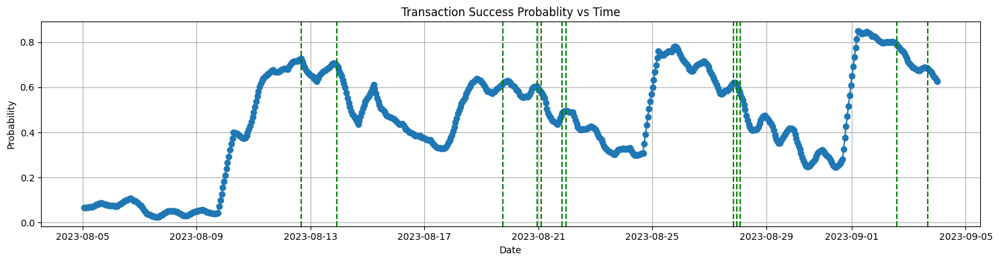

In [85]:
import pandas as pd
import matplotlib.pyplot as plt

# Plot
plt.figure(figsize=(15, 4))
plt.plot(df['txn_time'], df['success_probablity'], marker='o')

for txn_time in sm_time[1:]:
    plt.axvline(x=txn_time, color='green', linestyle='--', label='Smart Retry Schedule')

plt.title('Transaction Success Probablity vs Time')
plt.xlabel('Date')
plt.ylabel('Probability')
plt.grid(True)
plt.tight_layout()
plt.show()

In [86]:
importances = model.feature_importances_
feature_names = X_train.columns if hasattr(X_train, "columns") else [f"feature_{i}" for i in range(X_train.shape[1])]
feature_names

['feature_0',
 'feature_1',
 'feature_2',
 'feature_3',
 'feature_4',
 'feature_5',
 'feature_6',
 'feature_7',
 'feature_8',
 'feature_9',
 'feature_10',
 'feature_11',
 'feature_12',
 'feature_13',
 'feature_14',
 'feature_15',
 'feature_16',
 'feature_17',
 'feature_18',
 'feature_19',
 'feature_20',
 'feature_21',
 'feature_22',
 'feature_23',
 'feature_24',
 'feature_25',
 'feature_26',
 'feature_27',
 'feature_28',
 'feature_29',
 'feature_30',
 'feature_31',
 'feature_32',
 'feature_33',
 'feature_34',
 'feature_35',
 'feature_36',
 'feature_37',
 'feature_38',
 'feature_39',
 'feature_40',
 'feature_41',
 'feature_42',
 'feature_43',
 'feature_44',
 'feature_45',
 'feature_46',
 'feature_47',
 'feature_48',
 'feature_49',
 'feature_50',
 'feature_51',
 'feature_52',
 'feature_53',
 'feature_54',
 'feature_55',
 'feature_56',
 'feature_57',
 'feature_58',
 'feature_59',
 'feature_60',
 'feature_61',
 'feature_62',
 'feature_63',
 'feature_64',
 'feature_65',
 'feature_66',
 'fea

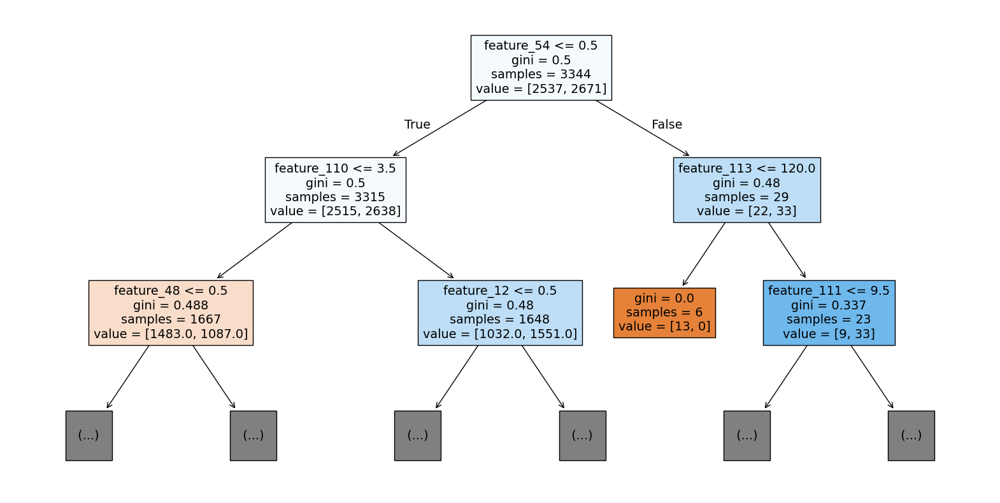

In [87]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

plt.figure(figsize=(20,10))
plot_tree(model.estimators_[5], filled=True, feature_names=feature_names, max_depth=2)
plt.show()

In [88]:
import pickle
with open('random_forest_model.pkl', 'wb') as f:
    pickle.dump(model, f)